# Imports and loading data

In [ ]:
import numpy as np
import matplotlib.pyplot as plt


train_acc = np.load('/content/LSTM_train.npy')
test_acc = np.load('/content/LSTM_test.npy')

print(train_acc)
print(test_acc)

[1.24926364 0.67631578]
[2.53074622 0.5714286 ]


In [ ]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
from collections import Counter
!pip install shap

from sympy.utilities.iterables import multiset_permutations

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler

     |████████████████████████████████| 564 kB 4.5 MB/s 


In [ ]:
data = np.load('15Features (1).npy')

# Removing NAN data

In [ ]:
# do we have any nan data?
print(f'Any nan? : {np.any(np.isnan(data))}')
print(f'Where: {np.where(np.isnan(data) == True)}')

Any nan? : False
Where: (array([], dtype=int64), array([], dtype=int64))


In [ ]:
# remove this nan data as is only 3 records/ 594
# although these are all of one class and relatively near eachother so this is worth investigating

new_data = data[~np.isnan(data).any(axis=1)]
print(f'Any nan?: {np.any(np.isnan(new_data))}')
print(f'Where: {np.where(np.isnan(new_data) == True)}')

Any nan?: False
Where: (array([], dtype=int64), array([], dtype=int64))


# Select features and labels & Test train split

In [ ]:
# select our 5 features
features = new_data[:,1:-1]
features = StandardScaler().fit_transform(features)

labels = new_data[:,-1]

print(f'features shape: {features.shape}, labels shape: {labels.shape}')
print(f'Labels counter: {Counter(labels)}')

features shape: (594, 15), labels shape: (594,)
Labels counter: Counter({0.0: 201, 1.0: 201, 2.0: 192})


## PCA

array([0.25850866, 0.23353446])

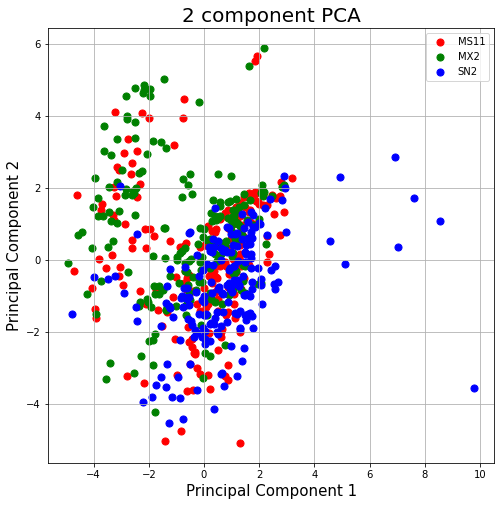

In [ ]:
pca = PCA(n_components=2)

principalComponents = pca.fit_transform(features)
principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2'])
finalDf = pd.concat([principalDf, pd.DataFrame(new_data[:,-1], columns=['Label'])], axis = 1)

fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA', fontsize = 20)
targets = [0, 1, 2]
colors = ['r', 'g', 'b']
for target, color in zip(targets,colors):
    indicesToKeep = finalDf['Label'] == target
    ax.scatter(finalDf.loc[indicesToKeep, 'principal component 1']
               , finalDf.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(['MS11','MX2','SN2'])
ax.grid()

pca.explained_variance_ratio_

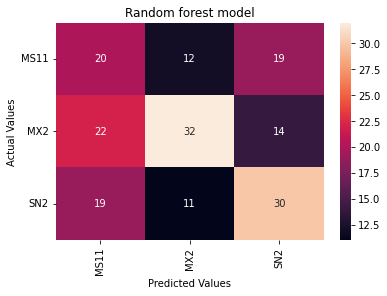

              precision    recall  f1-score   support

        MS11       0.33      0.39      0.36        51
         MX2       0.58      0.47      0.52        68
         SN2       0.48      0.50      0.49        60

    accuracy                           0.46       179
   macro avg       0.46      0.45      0.46       179
weighted avg       0.47      0.46      0.46       179



"\nfrom sklearn import metrics\ncf_matrix = confusion_matrix(, predictions_values.argmax(axis=1))\n\nsns.heatmap(cf_matrix, annot=True)\nplt.title(f'{model_name} model')\nplt.ylabel('Actual Values')\nplt.xlabel('Predicted Values')\nplt.yticks([0.5,1.5,2.5], labels, rotation='horizontal')\nplt.xticks([0.5,1.5,2.5], labels, rotation='vertical')\nplt.show()\n\n"

In [ ]:
rf = RandomForestClassifier(n_estimators=1000, class_weight=Counter(labels))

features = principalDf
labels = new_data[:,-1]

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
import seaborn as sns
X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.3, random_state=0)

rf.fit(X_train, y_train)
predictions = rf.predict(X_test)

conf_mat = confusion_matrix(y_test, predictions)
sns.heatmap(conf_mat, annot=True)
plt.title(f'Random forest model')
plt.ylabel('Actual Values')
plt.xlabel('Predicted Values')
plt.yticks([0.5,1.5,2.5], ['MS11','MX2','SN2'], rotation='horizontal')
plt.xticks([0.5,1.5,2.5], ['MS11','MX2','SN2'], rotation='vertical')
plt.show()

print(classification_report(y_test, predictions, target_names=['MS11','MX2','SN2']))

#cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
#n_scores = cross_val_score(rf, features, labels, scoring='accuracy', cv=cv, n_jobs=-1)
#print(np.round(np.mean(n_scores), 2))

'''
from sklearn import metrics
cf_matrix = confusion_matrix(, predictions_values.argmax(axis=1))

sns.heatmap(cf_matrix, annot=True)
plt.title(f'{model_name} model')
plt.ylabel('Actual Values')
plt.xlabel('Predicted Values')
plt.yticks([0.5,1.5,2.5], labels, rotation='horizontal')
plt.xticks([0.5,1.5,2.5], labels, rotation='vertical')
plt.show()

'''

In [ ]:
print('Score: ', rf.score(X_test, y_test))

from sklearn.metrics import mean_squared_error

mse = mean_squared_error(y_test, predictions)
rmse = mse**.5
print(mse)
print(rmse)

Score:  0.4581005586592179
1.1787709497206704
1.0857121854896308


# Models

## Model comparison

In [ ]:
def eval_model(model, n_splits=10):
  # k fold cross validation
  cv = RepeatedStratifiedKFold(n_splits=n_splits, n_repeats=3, random_state=1)
  n_scores = cross_val_score(model, features, labels, scoring='accuracy', cv=cv, n_jobs=-1)

  return np.round(np.mean(n_scores), 2)

In [ ]:
from sklearn.feature_selection import RFE
from sklearn.tree import DecisionTreeClassifier
from sklearn.pipeline import Pipeline

rfe = RFE(estimator=LogisticRegression(), n_features_to_select=2)
logisticRegr = LogisticRegression(multi_class='multinomial', solver = 'lbfgs', C=1e5, class_weight='balanced')


#pipeline = Pipeline(steps=[('s',rfe),('m',logisticRegr)])
# evaluate model
#cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
#n_scores = cross_val_score(pipeline, features, labels, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
# report performance
#print('Accuracy: %.3f (%.3f)' % (np.mean(n_scores), np.std(n_scores)))

rfe.fit(features, labels)
# summarize all features
for i in range(features.shape[1]):
  print('Column: %d, Selected %s, Rank: %.3f' % (i, rfe.support_[i], rfe.ranking_[i]))

print(features[:,rfe.support_])

Column: 0, Selected True, Rank: 1.000
Column: 1, Selected True, Rank: 1.000


TypeError: ignored

In [ ]:
n_splits = 10

# models
logisticRegr = LogisticRegression(multi_class='multinomial', solver = 'lbfgs', C=1e5, class_weight='balanced')

GBC = GradientBoostingClassifier(n_estimators=25, learning_rate=1.0,
    max_depth=6, random_state=0)

rf = RandomForestClassifier(n_estimators=100, class_weight=Counter(labels))

HGBC = HistGradientBoostingClassifier(max_iter=10)

KNN = KNeighborsClassifier(n_neighbors=2)

print(f'Logistic regression mean accuracy {eval_model(logisticRegr, n_splits)}')
print(f'Boosted DT mean accuracy {eval_model(GBC, n_splits)}')
print(f'Random forest mean accuracy {eval_model(rf,n_splits)}')
print(f'Hist gradient mean accuracy {eval_model(HGBC, n_splits)}')
print(f'KNN mean accuracy {eval_model(KNN, n_splits)}')

Logistic regression mean accuracy 0.62
Boosted DT mean accuracy 0.59
Random forest mean accuracy 0.64
Hist gradient mean accuracy 0.6
KNN mean accuracy 0.53


In [ ]:
rf_accuracy = []

best_model = RandomForestClassifier(n_estimators=100, class_weight=Counter(labels))
best_score = 0.0
best_features = features

for i in range(1,16):
  rfe = RFE(estimator=RandomForestClassifier(), n_features_to_select=i)
  rf = RandomForestClassifier(n_estimators=100, class_weight=Counter(labels))
  rfe.fit(features, labels)

  cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
  n_scores = cross_val_score(rf, features[:,rfe.support_], labels, scoring='accuracy', cv=cv, n_jobs=-1)
  mean_score = np.mean(n_scores)

  if mean_score > best_score:
    best_model = rf
    best_score = mean_score
    best_features = features[:,rfe.support_]

  rf_accuracy.append([i,mean_score])

In [ ]:
print(best_score)
print(np.shape(best_features))

0.6402824858757061
(594, 11)


y = 0.18566 * x + -0.04222 * x^2 + 0.00479


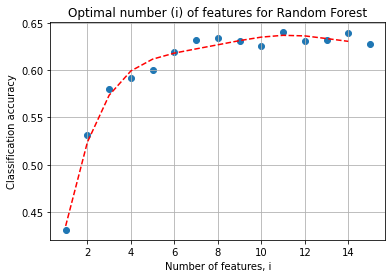

In [ ]:
from scipy.optimize import curve_fit

rf_accuracy = np.array(rf_accuracy)


# define the true objective function
def objective(x, a, b, c, d, e, f):
	return (a * x) + (b * x**2) + (c * x**3) + (d * x**4) + (e * x**5) + f
 
x = rf_accuracy[:,0]
y = rf_accuracy[:,1]
# curve fit
popt, _ = curve_fit(objective, x, y)
# summarize the parameter values
a, b, c, d, e, f = popt
print('y = %.5f * x + %.5f * x^2 + %.5f' % (a, b, c))
# plot input vs output
plt.scatter(x, y)
# define a sequence of inputs between the smallest and largest known inputs
x_line = np.arange(min(x), max(x), 1)
# calculate the output for the range
y_line = objective(x_line, a, b, c, d, e, f)
# create a line plot for the mapping function
plt.plot(x_line, y_line, '--', color='red')

plt.xlabel('Number of features, i')
plt.ylabel('Classification accuracy')
plt.title('Optimal number (i) of features for Random Forest')
plt.grid(True)

#plt.show()

In [ ]:
rf = RandomForestClassifier(n_estimators=100, class_weight=Counter(labels))

x_train, x_test, y_train, y_test = train_test_split(best_features, labels, test_size=0.2, random_state=1)
history = rf.fit(x_train, y_train)
score = rf.score(x_test, y_test)

estimator = rf.estimators_[5]

from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = ['a']*11,
                class_names = ['b']*3,
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

Fit model

In [ ]:
def fit_model(model, features):
  x_train, x_test, y_train, y_test = train_test_split(features, labels, test_size=0.2, random_state=1)
  history = model.fit(x_train, y_train)
  score = model.score(x_test, y_test)

  predictions = model.predict(x_test)
  # confusion matrix
  cm = metrics.confusion_matrix(y_test, predictions)
  plt.figure(figsize=(9,9))

  sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r');
  plt.ylabel('Actual label');
  plt.xlabel('Predicted label');
  all_sample_title = 'Accuracy Score: {0}'.format(np.round(score,2))
  plt.title(all_sample_title, size = 15);

  plt.show()

fit_model()

# Boosted decision tree

# Other methods